## В данном задании мы будем сжимать звуковую дорожку при помощи алгоритма PCA

In [51]:
# понадобится для чтения и записи аудио файлов
from scipy.io import wavfile

# это нужно для проигрывания аудио файлов прямо в блокноте
from IPython.display import Audio

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scipy as sp
from sklearn.decomposition import PCA
%matplotlib inline 
sns.set_theme()

In [2]:
#! wget https://www.dropbox.com/s/p5147nr8mzemxnr/Beethoven_Violin_Sonata_Op_96_first_movement_bars_1-22.wav

In [3]:
samplerate, data = wavfile.read('Beethoven_Violin_Sonata_Op_96_first_movement_bars_1-22.wav')

Выведем частоту дискретизации - она тут стандартная для аудио: 44100 Гц.

NOTE: **Частота дискретизации** говорит о том, сколько последовательных элементов массива с сигналом кодируют звук длительностью 1 секунда.

Подробнее о кодировании звука [тут](https://ru.wikipedia.org/wiki/Кодирование_звуковой_информации).

In [4]:
print(samplerate)

44100


In [5]:
# Если поделить длину массива сигнала на samplerate, получится длительность аудиодорожки в секундах

print(len(data) / samplerate)

# 45 секунд - похоже на правду:)

45.139591836734695


In [6]:
# Заметим, что звук - стерео, так как сигнал кодируется двумя каналами (для левого и правого динамика):

print(data.shape)

(1990656, 2)


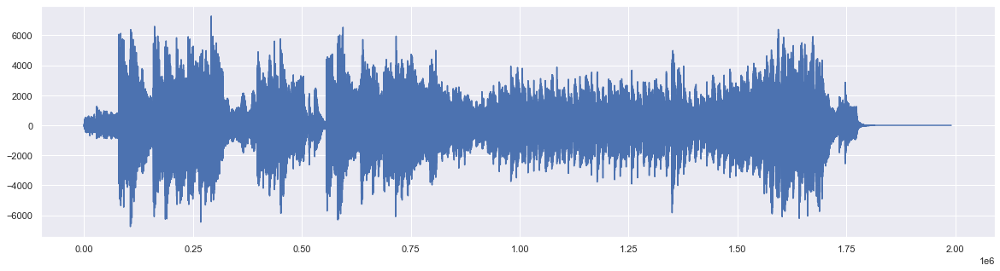

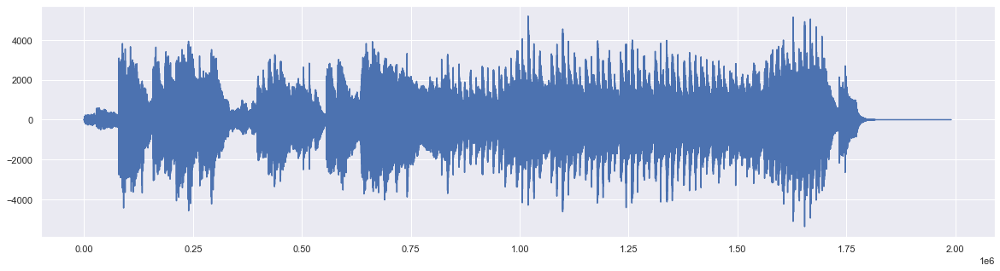

In [41]:
# Отрисуем сигналы в обоих каналах

# Канал 1
plt.figure(figsize=(20,5))
plt.plot(data[:,0])
plt.show()

# Канал 2
plt.figure(figsize=(20,5))
plt.plot(data[:,1])
plt.show()

In [8]:
# Усредним каналы, и получим моно звук, с которым будет проще работать

mono_sound = np.mean(data, axis=1)
print(mono_sound.shape)

(1990656,)


In [9]:
# Давайте послушаем наконец, что же мы будем сжимать:)

Audio(mono_sound, rate = samplerate)

In [10]:
# Для удобства - обрежем массив с сигналом так, чтобы его было удобнее делить на равные части, датасет из которых и необходимо будет сжать известными вам методами.
# На самом деле способ очень похож на тот, которым мы сжимали картинку, деля её на прямоугольные подкартинки)

mono_sound_to_cut = mono_sound[:1990000]

#### Задание 1:

1. Разделите сигнал на равные части (длину каждой части возьмите равной 1000).

2. Соберите из них "датасет", который будет представим в виде двуменого массива - "матрицы". (каждая часть длины 1000 -- одна строка)

3. Напишите функцию, которая будет переводить вашу "матрицу" обратно в звуковой сигнал. Проверьте что все работает, путем воспроизведения востановленного сигнала.

Подсказка: Вспомните про метод `.reshape()`

In [118]:
cut_sound = mono_sound_to_cut.reshape((len(mono_sound_to_cut) // 1000, 1000))
cut_sound

array([[  0. ,  -1. ,  -1. , ...,  88.5,  58.5,  18. ],
       [-25.5, -61.5, -81.5, ...,  30.5, -20.5, -53. ],
       [-67.5, -65.5, -50. , ..., 118.5, 118.5,  86.5],
       ...,
       [  0. ,   0. ,   0. , ...,   0. ,   0. ,   0. ],
       [  0. ,   0. ,   0. , ...,   0. ,   0. ,   0. ],
       [  0. ,   0. ,   0. , ...,   0. ,   0. ,   0. ]])

In [32]:
def matrix_to_sound(matrix):
    sound = matrix.flatten()
    return sound


In [35]:
restored_cut_sound = matrix_to_sound(cut_sound)
restored_cut_sound

array([ 0., -1., -1., ...,  0.,  0.,  0.])

In [54]:
Audio(restored_cut_sound, rate = samplerate)

#### Задание 2

1. Выполните PCA преобразование, и получите данные, сжатые в пространство меньшей размерности  

2. Постройте сами две главные компоненты в наглядной форме. Сделайте выводы исходя из их вида.

3. Постройте scatter plot датасета в просрансве первых двух компонент, а третью используйте как цвет

Подсказка: код этого пункта практически полностью совпадает с кодом, который мы использовали на семинаре.

In [160]:
def main_component(data, n_components):
  pca = PCA(n_components=n_components)
  pca.fit_transform(data)
  return plt.plot(pca.explained_variance_ratio_.cumsum())

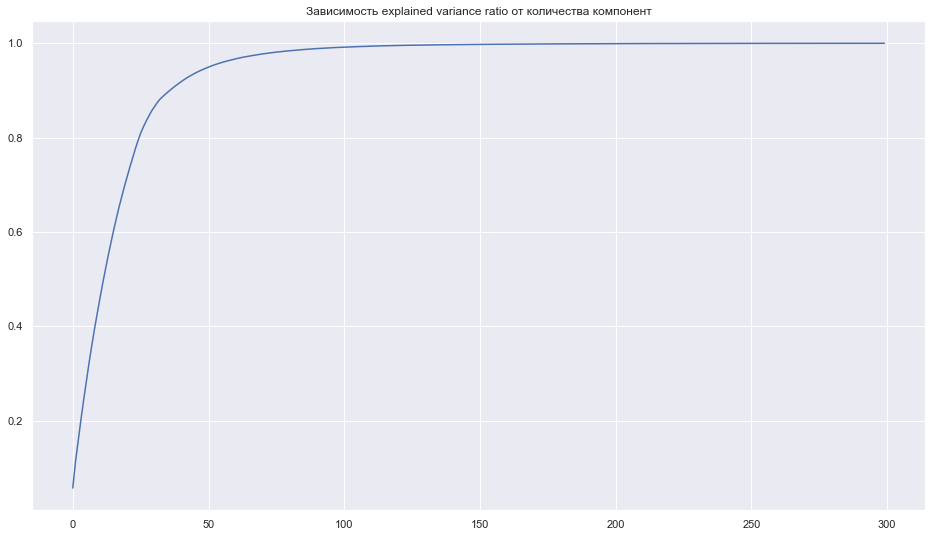

In [180]:
plt.figure(figsize=(16,9))
plt.title("Зависимость explained variance ratio от количества компонент")
main_component(cut_sound, n_components=300)
plt.show()

In [141]:
pca = PCA(n_components=100)
Y = pca.fit_transform(cut_sound)

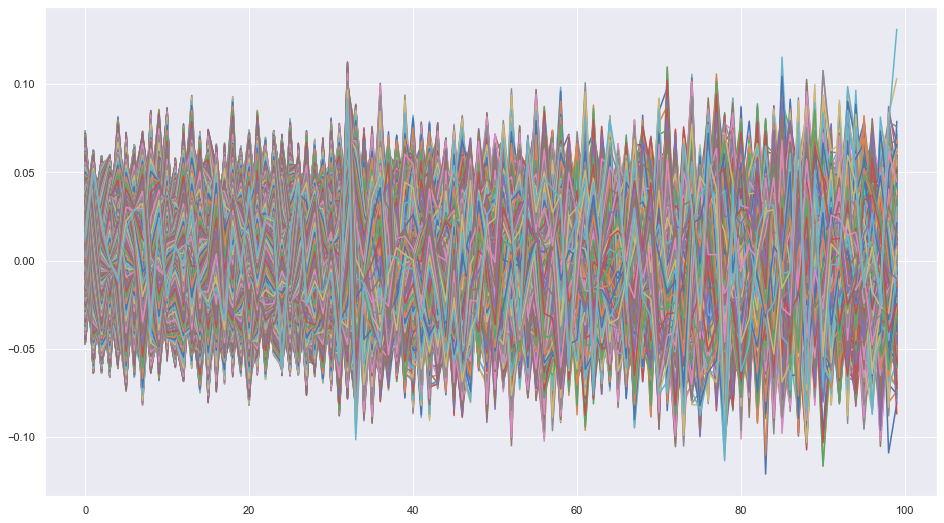

In [178]:
plt.figure(figsize=(16,9))
plt.plot(pca.components_)
plt.show()

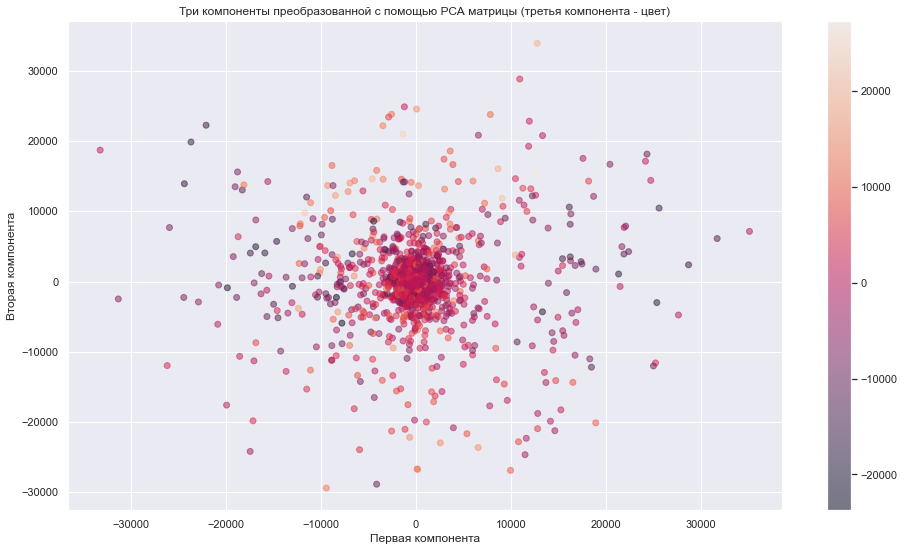

In [179]:
plt.figure(figsize=(16,9))
plt.scatter(Y[:, 0], Y[:, 1], c=Y[:, 2], alpha=0.5)
plt.colorbar()
plt.title("Три компоненты преобразованной с помощью РСА матрицы (третья компонента - цвет)")
plt.xlabel("Первая компонента")
plt.ylabel("Вторая компонента")
plt.show()


Значения матрицы главных компонент лежат в диапазоне от -0.1 до 0.1

#### Задание 3

1. Выполните обратное PCA преобразование сжатых данных и получите "матрицу" с сжатым звуком

2. Преобразуйте "матрицу" в сигнал (одномерный массив), и послушайте результат (Audio(YOUR_RESULT, rate = samplerate)

In [154]:
X_hat = pca.inverse_transform(Y)
Audio(matrix_to_sound(X_hat), rate = samplerate)